**Topic Modeling**
---
As the name suggests, it is a process to automatically identify topics present in a text object and to derive hidden patterns exhibited by a text corpus.

Topics can be defined as “a repeating pattern of co-occurring terms in a corpus”. A good topic model should result in – “health”, “doctor”, “patient”, “hospital” for a topic – Healthcare, and “farm”, “crops”, “wheat” for a topic – “Farming”.

Topic Models are very useful for the purpose for document clustering, organizing large blocks of textual data, information retrieval from unstructured text and feature selection. For Example – New York Times are using topic models to boost their user – article recommendation engines. Various professionals are using topic models for recruitment industries where they aim to extract latent features of job descriptions and map them to right candidates. They are being used to organize large datasets of emails, customer reviews, and user social media profiles.
[Reference](https://www.analyticsvidhya.com/blog/2016/08/beginners-guide-to-topic-modeling-in-python/)

### Import Packages

In [0]:
import pandas as pd
import numpy as np

In [0]:
import nltk
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

from gensim.models import CoherenceModel

# Plotting tools
!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

nltk.download('stopwords')
nltk.download('wordnet')

     |████████████████████████████████| 1.6MB 8.9MB/s 
     |████████████████████████████████| 552kB 44.3MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97711 sha256=0e5ba8e382b015eed3fbb267afa2994082570f7747d67902bcb503ab1560571b
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
  Created wheel for funcy: filename=funcy-1.14-py2.py3-none-any.whl size=32040 sha256=f11e7ce670bba9bc4837c1c331a13ba4d1561e783b73517b2d3993ab2a423526
  Stored in directory: /root/.cache/pip/wheels/20/5a/d8/1d875df03deae6f178dfdf70238cca33f948ef8a6f5209f2eb
Successfully built pyLDAvis funcy
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

### Loading Data

In [0]:
data = pd.read_csv('Datagals_BOM.csv')

In [0]:
data

,Title,plot,gross,distributor,budget,released_data,Field5,runtime,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7
0,Avengers: Endgame,After the devastating events of Avengers: Infi...,32839486,Walt Disney Studios Motion Pictures,356000000.0,4/24/2019,PG-13,181,Action,Adventure,Drama,Sci-Fi,NaN,NaN,NaN
1,Beauty and the Beast,A selfish prince is cursed to become a monster...,13501376,Walt Disney Studios Motion Pictures,160000000.0,3/16/2017,PG,129,Family,Fantasy,Musical,Romance,NaN,NaN,NaN
2,Spider-Man: Far from Home,"Following the events of Avengers: Endgame, Spi...",10578935,Sony Pictures Releasing,160000000.0,7/3/2019,PG-13,129,Action,Adventure,Sci-Fi,NaN,NaN,NaN,NaN
3,Jurassic World,"A new theme park, built on the original site o...",11121208,Universal Pictures International (UPI),150000000.0,6/10/2015,PG-13,124,Action,Adventure,Sci-Fi,NaN,NaN,NaN,NaN
4,The Twilight Saga: Eclipse,As a string of mysterious killings grips Seatt...,6317882,Pioneer Films,68000000.0,6/30/2010,PG-13,124,Action,Drama,Fantasy,Romance,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,Nandito ako... Nagmamahal sa 'yo,"Tata went back to his hometown, Bohol with his...",111620,NaN,NaN,9/30/2009,NaN,0,Drama,Romance,NaN,NaN,NaN,NaN,NaN
993,Catch Me... I'm in Love,A ladies man falls for a renowned radio DJ.,2785978,Star Cinema,NaN,3/23/2011,NaN,0,Comedy,Drama,Romance,NaN,NaN,NaN,NaN
994,Kimmy Dora and the Temple of Kiyeme,The adult twin daughters of an aging business ...,3204780,Star Cinema,NaN,6/13/2012,NaN,0,Comedy,Horror,NaN,NaN,NaN,NaN,NaN
995,Starting Over Again,A pair of exes run into each other again years...,9096712,Star Cinema,NaN,2/12/2014,NaN,0,Drama,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
data['plot'].isna().sum()

12

In [0]:
new_data = data['plot'].dropna()

In [0]:
new_data.isna().sum()

0

### Cleaning and Preprocessing

In [0]:
stop = set(stopwords.words('english'))
exclude = set(string.punctuation) 
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in new_data] 
doc_clean

[['devastating',
  'event',
  'avenger',
  'infinity',
  'war',
  'universe',
  'ruin',
  'help',
  'remaining',
  'ally',
  'avenger',
  'assemble',
  'order',
  'reverse',
  'thanos',
  'action',
  'restore',
  'balance',
  'universe'],
 ['selfish',
  'prince',
  'cursed',
  'become',
  'monster',
  'rest',
  'life',
  'unless',
  'learns',
  'fall',
  'love',
  'beautiful',
  'young',
  'woman',
  'keep',
  'prisoner'],
 ['following',
  'event',
  'avenger',
  'endgame',
  'spiderman',
  'must',
  'step',
  'take',
  'new',
  'threat',
  'world',
  'changed',
  'forever'],
 ['new',
  'theme',
  'park',
  'built',
  'original',
  'site',
  'jurassic',
  'park',
  'creates',
  'genetically',
  'modified',
  'hybrid',
  'dinosaur',
  'indominus',
  'rex',
  'escape',
  'containment',
  'go',
  'killing',
  'spree'],
 ['string',
  'mysterious',
  'killing',
  'grip',
  'seattle',
  'bella',
  'whose',
  'high',
  'school',
  'graduation',
  'fast',
  'approaching',
  'forced',
  'choose

### Preparing Document - Term Matrix

In [0]:
# Importing Gensim
import gensim
from gensim import corpora

# Creating the term dictionary of our courpus, where every unique term is assigned an index. 
dictionary = corpora.Dictionary(doc_clean)

# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 2),
  (16, 1)],
 [(17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1)],
 [(3, 1),
  (6, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1)],
 [(38, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1)],
 [(24, 1),
  (54, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1)],
 [(80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86,

### Running Latent Dirichlet Allocation (LDA) Model

In [0]:
# Creating the object for LDA model using gensim library
Lda = gensim.models.ldamodel.LdaModel

# Running and Trainign LDA model on the document term matrix.
ldamodel = Lda(doc_term_matrix, num_topics=3, id2word = dictionary, passes=50, random_state=42)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

### Elbow Method

In [0]:
perps = []
for n_topics in [1, 2, 3 ,4 ,5, 6]:
  # Creating the object for LDA model using gensim library
  Lda = gensim.models.ldamodel.LdaModel

  # Running and Trainign LDA model on the document term matrix.
  ldamodel_iter = Lda(doc_term_matrix, num_topics=n_topics, id2word = dictionary, passes=50, random_state=42)

  # Compute Perplexity
  perplexity = ldamodel_iter.log_perplexity(doc_term_matrix)
  print('\nPerplexity: ', perplexity)  # a measure of how good the model is. lower the better.
  
  # Store perplexity in list
  perps.append([n_topics, perplexity])

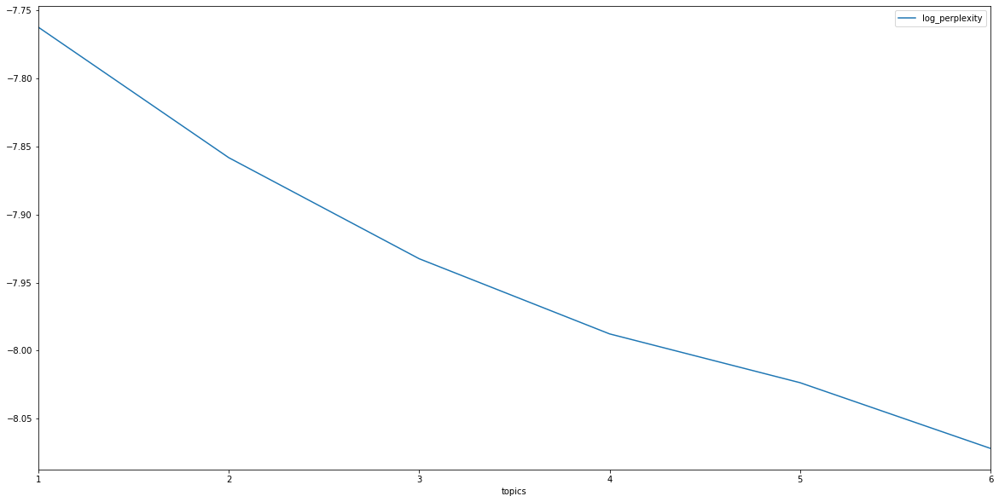

In [0]:
perps_df = pd.DataFrame(perps, columns=['topics', 'log_perplexity'])
perps_df.set_index('topics').plot(figsize=(20, 10))

### Results

#### Topic - Word Distribution

In [17]:
print(ldamodel.print_topics(num_topics=3, num_words=2))

[(0, '0.006*"young" + 0.006*"find"'), (1, '0.008*"world" + 0.007*"new"'), (2, '0.007*"life" + 0.007*"find"')]


Above result shows 3 main topics:

---

> Topic 0: Young

> Topic 1: World

> Topic 2: Life

#### Document - Topic Distribution

In [0]:
topic_lists = ['Young', 'World', 'Life', ]

In [0]:
lists = ldamodel.get_document_topics(doc_term_matrix, minimum_probability=0.0)

In [0]:
document_topic_dist = pd.DataFrame([i for i in lists]).apply(lambda x: [i[1] for i in x])

In [23]:
print(document_topic_dist)

            0         1         2
0    0.018177  0.543731  0.438092
1    0.022090  0.021788  0.956122
2    0.025645  0.027269  0.947086
3    0.016609  0.016825  0.966566
4    0.017606  0.016899  0.965496
..        ...       ...       ...
980  0.015189  0.015892  0.968920
981  0.056616  0.888316  0.055068
982  0.016195  0.015566  0.968238
983  0.929428  0.035422  0.035150
984  0.929430  0.035420  0.035150

[985 rows x 3 columns]


### Compute Perplexity and Coherence Socre

In [24]:
# Compute Perplexity
print('\nPerplexity: ', ldamodel.log_perplexity(doc_term_matrix))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for


Perplexity:  -8.374703268532505

Coherence Score:  0.23475599370493452


### Visualize Topics-Keywords

In [25]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(ldamodel, doc_term_matrix, dictionary)
vis

/usr/local/lib/python3.6/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.006571 -0.081722       1        1  35.450367
1     -0.078128  0.035479       2        1  34.890408
0      0.071556  0.046243       3        1  29.659227, topic_info=     Category       Freq    Term      Total  loglift  logprob
142   Default  47.000000     get  47.000000  30.0000  30.0000
1257  Default  20.000000   house  20.000000  29.0000  29.0000
243   Default  40.000000    team  40.000000  28.0000  28.0000
119   Default  20.000000    plan  20.000000  27.0000  27.0000
74    Default  30.000000  school  30.000000  26.0000  26.0000
...       ...        ...     ...        ...      ...      ...
242    Topic3  12.749607     set  47.235004  -0.0942  -6.0739
41     Topic3  12.789552    take  50.306530  -0.1541  -6.0708
128    Topic3  12.075689  father  50.335953  -0.2121  -6.1282
9      Topic3  11.539292   order  38.814144   0.0024  -6.1736
243    Topic3  11.561497    team  40.344028  -0.0344  -6.1717

[251 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
2953      3  0.804704       12
0         2  0.910513   action
720       1  0.312596    agent
720       2  0.078149    agent
720       3  0.586118    agent
...     ...       ...      ...
32        1  0.375267    young
32        2  0.227434    young
32        3  0.398010    young
1633      1  0.167034  younger
1633      3  0.835169  younger

[343 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 1])

In [0]:
pyLDAvis.save_html(vis, 'lda.html')